# Pooling
1. [Average vs max pooling](#average-vs-max-pooling)
2. [Stride size comparison](#stride-size-comparison)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

IMGS = ['./assets/starry-night-over-the-rhone.png', './assets/house-of-the-dragon.png', './assets/dog.png', './assets/traffic.jpg']

### Average vs max pooling

In [72]:
from typing import Literal
def pool_image(image, pool_size, stride, pool_type: Literal['max', 'avg']):
  h, w, c = image.shape
  ph = pw = pool_size

  new_h = (h - ph) // stride + 1
  new_w = (w - pw) // stride + 1

  new_image = np.zeros((new_h, new_w, c), dtype=np.float32)
  for channel in range(c):
    for h_idx in range(new_h):
      for w_idx in range(new_w):
        h_start = h_idx * stride
        h_end = h_start + ph
        w_start = w_idx * stride
        w_end = w_start + pw

        window = image[h_start:h_end, w_start:w_end, channel]
        if pool_type == 'max':
          new_image[h_idx, w_idx, channel] = np.max(window, axis=(0, 1))
        elif pool_type == 'avg':
          new_image[h_idx, w_idx, channel] = np.mean(window, axis=(0, 1)) 
  return new_image

(781, 1005, 3)
(390, 502, 3)
(390, 502, 3)


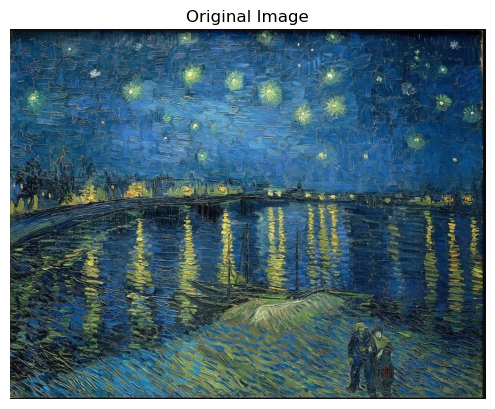

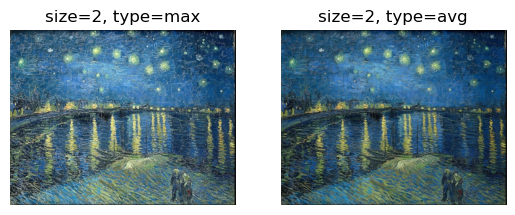

(389, 501, 3)
(389, 501, 3)


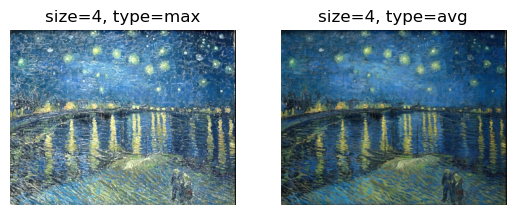

(387, 499, 3)
(387, 499, 3)


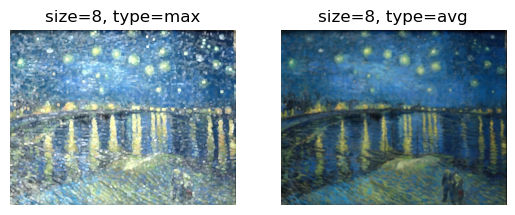

(930, 1804, 3)
(465, 902, 3)
(465, 902, 3)


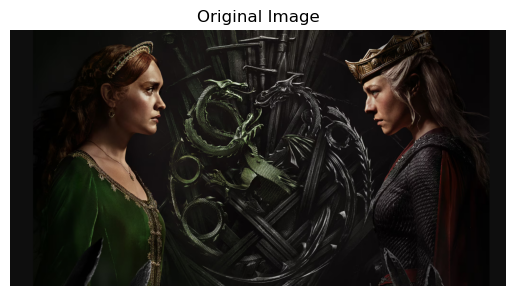

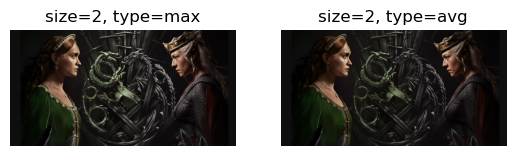

(464, 901, 3)
(464, 901, 3)


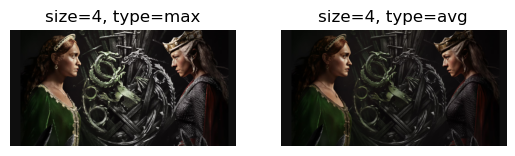

(462, 899, 3)
(462, 899, 3)


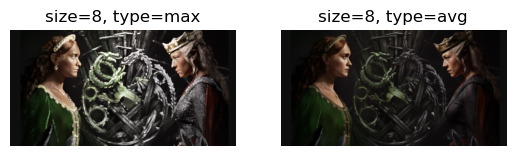

(625, 1000, 3)
(312, 500, 3)
(312, 500, 3)


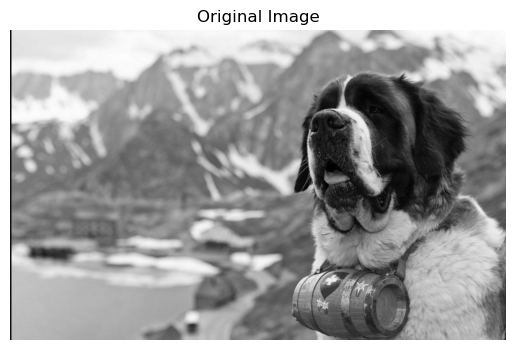

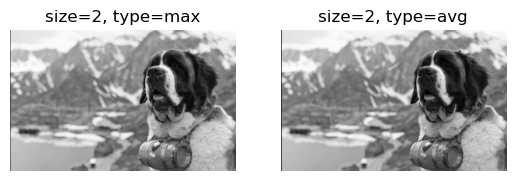

(311, 499, 3)
(311, 499, 3)


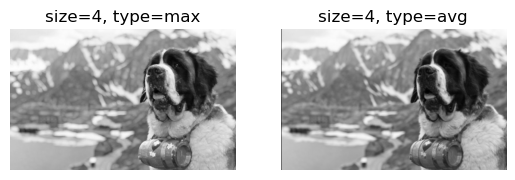

(309, 497, 3)
(309, 497, 3)


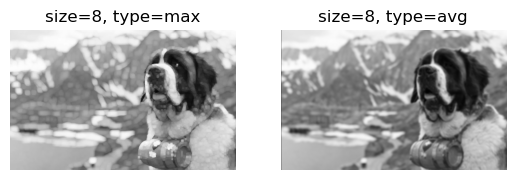

(1067, 1600, 3)
(533, 800, 3)
(533, 800, 3)


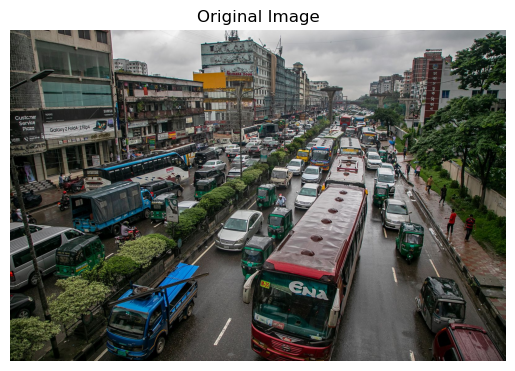

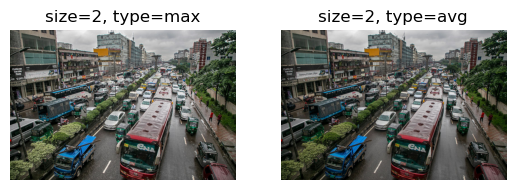

(532, 799, 3)
(532, 799, 3)


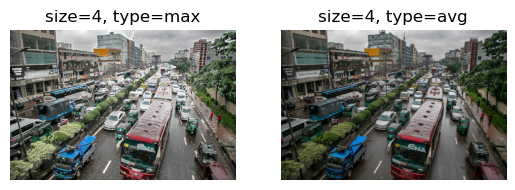

(530, 797, 3)
(530, 797, 3)


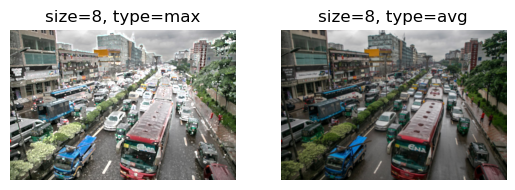

In [73]:
POOL_TYPES = ['max', 'avg']
for image_path in IMGS:
  image = cv2.imread(image_path, cv2.IMREAD_COLOR)
  image = image / 255.0
  image = image.astype(np.float32)

  plt.figure()
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.title(f'Original Image ({image.shape})')
  plt.axis('off')

  for pool_size in [2, 4, 8]:
    _, axs = plt.subplots(1, 2)
    for i, pool_type in enumerate(POOL_TYPES):
      pooled_image = pool_image(image, pool_size, 2, pool_type)
      print(pooled_image.shape)
      axs[i].imshow(cv2.cvtColor(pooled_image, cv2.COLOR_BGR2RGB))
      axs[i].set_title(f'size={pool_size}, type={pool_type}')
      axs[i].axis('off')
    plt.show()

### Stride size comparison

(390, 502, 3)
(195, 251, 3)
(98, 126, 3)


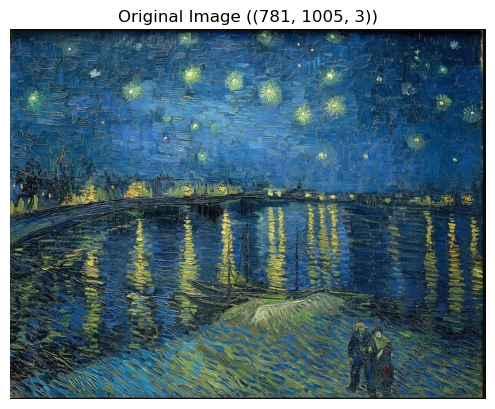

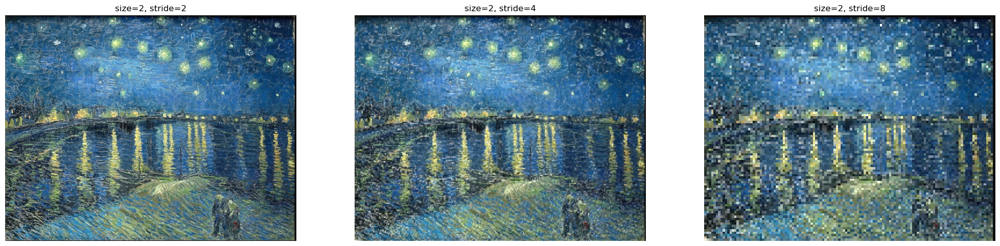

(389, 501, 3)
(195, 251, 3)
(98, 126, 3)


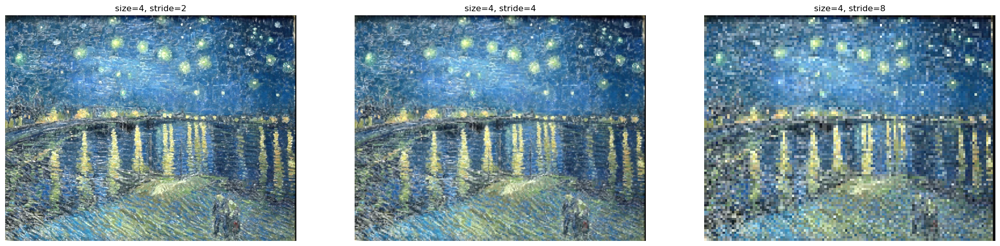

(387, 499, 3)
(194, 250, 3)
(97, 125, 3)


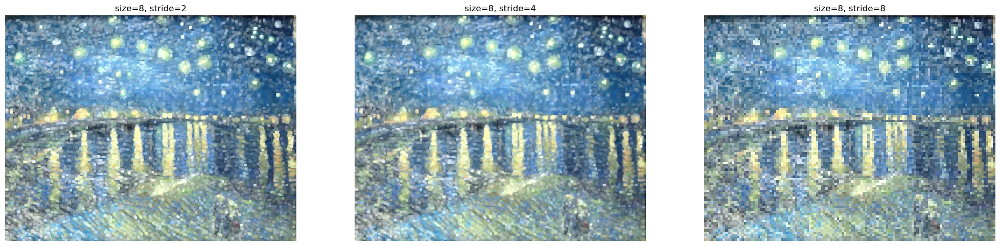

(465, 902, 3)
(233, 451, 3)
(117, 226, 3)


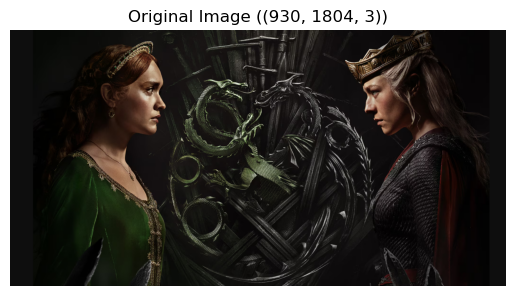

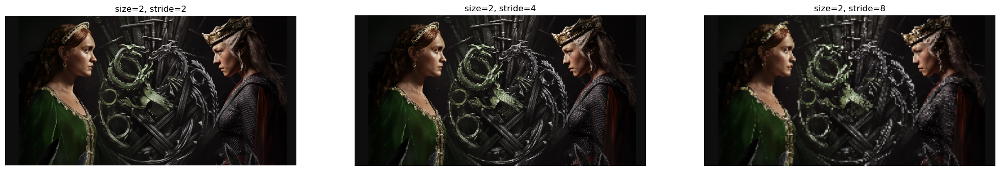

(464, 901, 3)
(232, 451, 3)
(116, 226, 3)


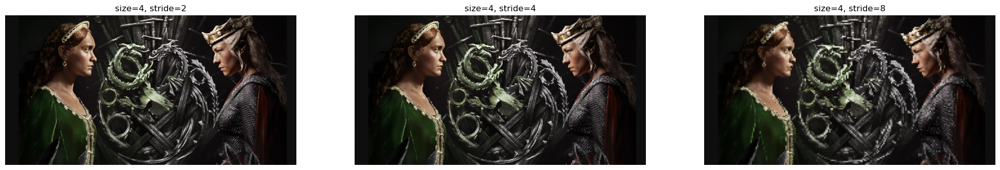

(462, 899, 3)
(231, 450, 3)
(116, 225, 3)


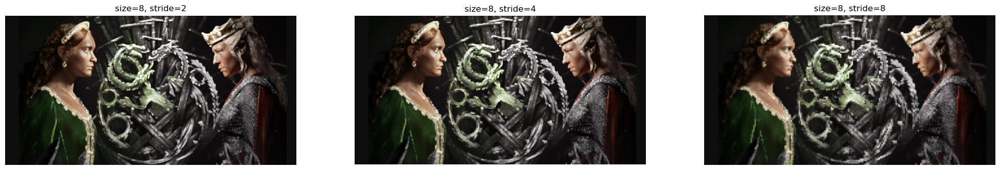

(312, 500, 3)
(156, 250, 3)
(78, 125, 3)


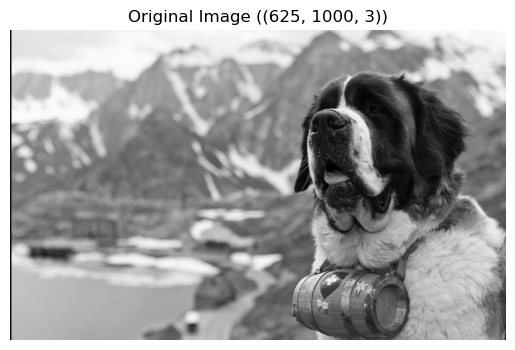

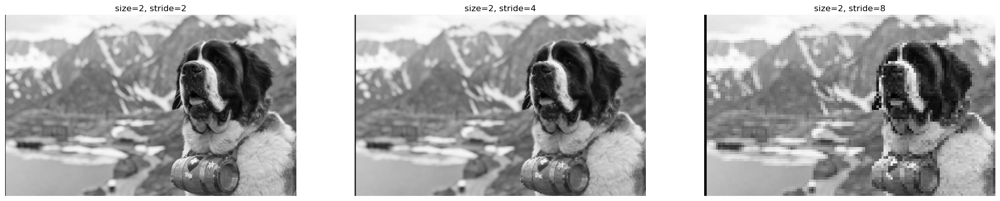

(311, 499, 3)
(156, 250, 3)
(78, 125, 3)


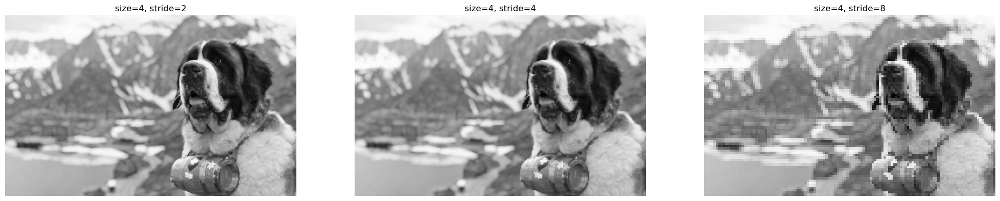

(309, 497, 3)
(155, 249, 3)
(78, 125, 3)


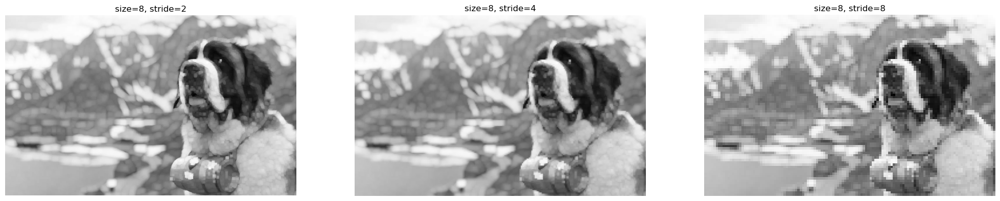

(533, 800, 3)
(267, 400, 3)
(134, 200, 3)


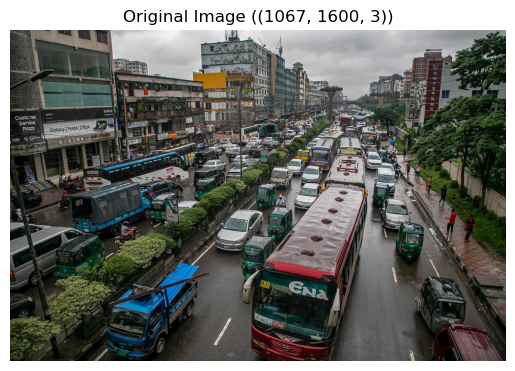

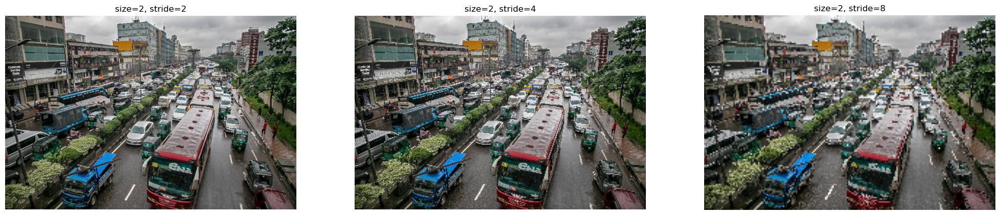

(532, 799, 3)
(266, 400, 3)
(133, 200, 3)


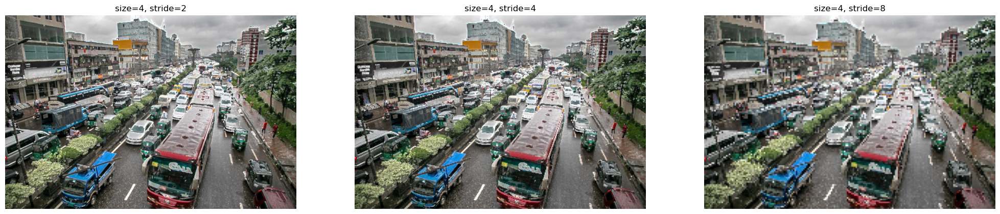

(530, 797, 3)
(265, 399, 3)
(133, 200, 3)


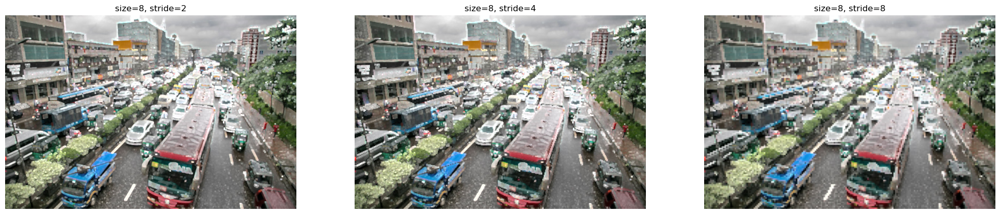

In [83]:
STRIDES = [2, 4, 8]
for image_path in IMGS:
  image = cv2.imread(image_path, cv2.IMREAD_COLOR)
  image = image / 255.0
  image = image.astype(np.float32)

  plt.figure()
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.title(f'Original Image ({image.shape})')
  plt.axis('off')

  for pool_size in [2, 4, 8]:
    _, axs = plt.subplots(1, len(STRIDES), figsize=(25, 15))
    for i, stride in enumerate(STRIDES):
      pooled_image = pool_image(image, pool_size, stride, 'max')
      print(pooled_image.shape)
      axs[i].imshow(cv2.cvtColor(pooled_image, cv2.COLOR_BGR2RGB))
      axs[i].set_title(f'size={pool_size}, stride={stride}')
      axs[i].axis('off')
    plt.show()